In [1]:
import json

# Load the dataset
with open("C:/Users/ASUS/Desktop/Project/MS_Project/MMHS150K/MMHS150K_GT.json", 'r') as file:
    data = json.load(file)

In [2]:
combined_names_mapping = {
    0: 'Not Hate Speech',
    1: 'Identity-Based',
    2: 'Gender and Sexual Orientation-Based',
    5: 'Other forms of Hate Speech'
}

# Function to combine classes
def combine_classes(original_class):
    if original_class in [1, 4]:  # Combine classes 1 and 4 into 1
        return 1
    elif original_class in [2, 3]:  # Combine classes 2 and 3 into 2
        return 2
    else:
        return original_class  # Keep classes 0 and 5 unchanged

for tweet_id, tweet_data in data.items():
    original_classes = tweet_data['labels']
    combined_classes = [combine_classes(cls) for cls in original_classes]
    tweet_data['combined_labels'] = combined_classes
    tweet_data['combined_names_str'] = combined_names_mapping.get(combined_classes[0], 'Unknown')


In [3]:
id_train0 = open("C:/Users/ASUS/Desktop/Project/MS_Project/MMHS150K/splits/train_ids.txt").read()
id_train = id_train0.split()

id_val0 = open("C:/Users/ASUS/Desktop/Project/MS_Project/MMHS150K/splits/val_ids.txt").read()
id_val = id_val0.split()

id_test0 = open("C:/Users/ASUS/Desktop/Project/MS_Project/MMHS150K/splits/test_ids.txt").read()
id_test = id_test0.split()

In [5]:

dict_train = {x: data[x] for x in id_train}
dict_val = {x: data[x] for x in id_val}
dict_test = {x: data[x] for x in id_test}

print('Length: %d observations for the train set, %d for the validation and %d for the test.' % 
      (len(dict_train), len(dict_val), len(dict_test)))

Length: 134823 observations for the train set, 5000 for the validation and 10000 for the test.


dict_val

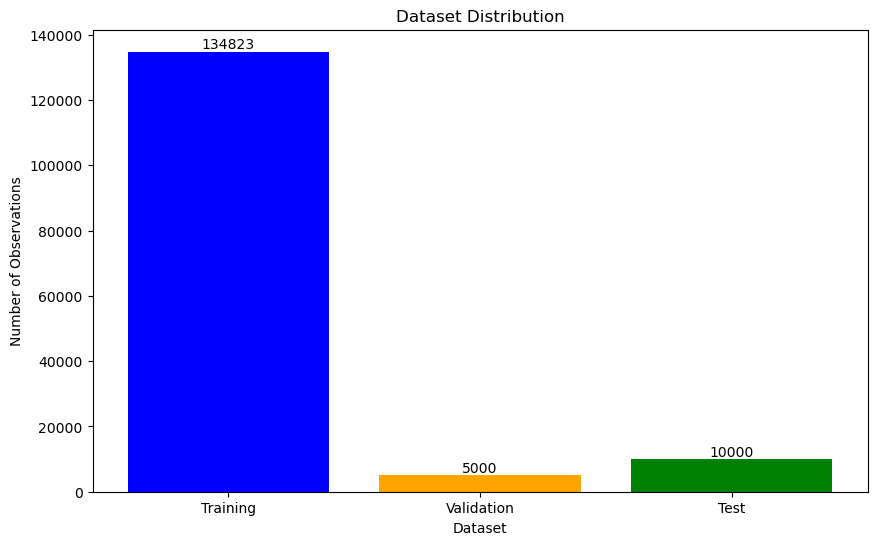

In [7]:
import matplotlib.pyplot as plt


lengths = [len(dict_train), len(dict_val), len(dict_test)]
sets = ['Training', 'Validation', 'Test']


plt.figure(figsize=(10, 6))
bars = plt.bar(sets, lengths, color=['blue', 'orange', 'green'])

plt.title('Dataset Distribution')
plt.xlabel('Dataset')
plt.ylabel('Number of Observations')

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), ha='center', va='bottom')

# Display the plot
plt.show()


In [8]:
# Number of observations from the chart
training_count = 134823
validation_count = 5000
test_count = 10000


total_count = training_count + validation_count + test_count

training_ratio = training_count / total_count
validation_ratio = validation_count / total_count
test_ratio = test_count / total_count

print(f"Training set ratio: {training_ratio:.4f}")
print(f"Validation set ratio: {validation_ratio:.4f}")
print(f"Test set ratio: {test_ratio:.4f}")


Training set ratio: 0.8999
Validation set ratio: 0.0334
Test set ratio: 0.0667


In [9]:

import pandas as pd
import numpy as np
import json

from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
import data_clean_proc as dc

In [10]:
def extract_text_and_combined_labels(data_dict):
    texts = []
    combined_labels_list = []

    for tweet_id, tweet_data in data_dict.items():
        texts.append(tweet_data['tweet_text'])
        combined_labels_list.append(tweet_data['combined_labels'])

    return texts, combined_labels_list


text_train, labels3_train = extract_text_and_combined_labels(dict_train)
text_val, labels3_val = extract_text_and_combined_labels(dict_val)
text_test, labels3_test = extract_text_and_combined_labels(dict_test)


labels3_train



In [12]:
from collections import Counter
import numpy as np
from random import choice

def custom_majority_vote(annotations):
    """
    Determines a custom majority vote for each data point according to specific rules:
    - If there's no majority and only hate speech classes are present, select randomly among them.
    - If the votes are between two zeros and one hate speech, select 0.
    
    Parameters:
    annotations (list of list of int): The annotations for each data point.
    
    Returns:
    numpy.ndarray: The custom majority class for each data point.
    """
    custom_votes = []

    for annotation in annotations:
        counts = Counter(annotation)
        max_count = max(counts.values())
        candidates = [k for k, v in counts.items() if v == max_count]
        
        if len(candidates) > 1:
          
            hate_speech_candidates = [c for c in candidates if c != 0]
            if hate_speech_candidates:
                custom_votes.append(choice(hate_speech_candidates))
            else:
                custom_votes.append(0)
        elif len(set(annotation)) == 3 and counts[0] == 2:
            custom_votes.append(0)
        else:
            custom_votes.append(candidates[0])
            
    return np.array(custom_votes)


labels_train = custom_majority_vote(labels3_train)
labels_val = custom_majority_vote(labels3_val)
labels_test = custom_majority_vote(labels3_test)

print(labels_train)
print(np.unique(labels_train))

[1 1 1 ... 0 0 0]
[0 1 2 5]


In [13]:
labels_val[0:10]

array([2, 2, 2, 2, 1, 1, 1, 1, 5, 2])

In [14]:
    print('Final text:', text_val[9])
    print('Final labels:', labels_val[9]) # 1 = Hate

    print('Final text length:', len(text_val))
    print('Final labels length:', len(labels_val))

Final text: A dyke / fem meet up would be dope.  But dykes are historically, hereditarily,  and pathologically broke https://t.co/4zBhxPBpGr
Final labels: 2
Final text length: 5000
Final labels length: 5000


In [15]:
print('Number of tweets:', len(data))

Number of tweets: 149823


In [16]:
all_labels = np.concatenate((labels_train, labels_val, labels_test))

np.set_printoptions(suppress = True)
unique_vals, count_vals = np.unique(all_labels, return_counts = True)
print(np.asarray((unique_vals, count_vals)))

[[     0      1      2      5]
 [112845  15890  11944   9144]]


In [17]:
all_labels3 = labels3_train + labels3_val + labels3_test
all_zeros, one_zero, two_zero, all_hate = dc.annot_agreement(all_labels3)
print(all_zeros, one_zero, two_zero, all_hate)

57903 28401 54920 8599


In [18]:
# Tokenizer object
tokens = Tokenizer()
tokens.fit_on_texts(text_train)
print('Total input of documents for tokenizer:', tokens.document_count)

# Train set
# Tokens to number sequences
text_encoded_train = tokens.texts_to_sequences(text_train)

# Padding to a determined length
max_length_tokens = 70 # Maximum characters in tweets is 280, assumption: 70 words (of 4 characters)
text_padded_train = pad_sequences(text_encoded_train,
                            maxlen = max_length_tokens, 
                            padding = 'post') # Padding after sequence

Total input of documents for tokenizer: 134823


In [19]:
print("Before Padding:")
for seq in text_encoded_train:
    print(seq)

# Apply padding
text_padded_train = pad_sequences(text_encoded_train,
                                  maxlen=max_length_tokens,
                                  padding='post')  # Padding after sequence

# Visualize after padding
print("\nAfter Padding:")
for seq in text_padded_train:
    print(seq)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[50, 16611, 830, 269, 111, 77, 5594, 22145, 57, 315, 21, 9, 4, 21338, 3, 1, 2, 235191]
[77, 6, 4, 2980, 99, 30, 3661, 3, 1, 2, 235192]
[235193, 9, 51, 8652, 50, 25, 273, 442, 20, 59, 4, 25, 40, 235194, 3, 1, 2, 235195]
[8, 219, 5, 4, 33, 1381, 18, 8, 33, 2770, 14, 7, 33, 3032, 3, 1, 2, 235196]
[12945, 2062, 227, 564, 13, 7, 913, 26, 99, 2212, 88, 3, 1, 2, 235197]
[352, 37, 2103, 235198, 3, 1, 2, 235199]
[5, 3214, 855, 247, 12, 617, 258, 38, 168, 13, 11784, 13, 377, 2391, 10, 69, 27, 14, 4933, 3, 1, 2, 235200]
[27, 5425, 94, 2582, 130, 29, 17, 6636, 3985, 585, 2429, 7608, 12674, 641, 198, 323, 3, 1, 2, 235201, 3, 1, 2, 235202]
[6, 10993, 7242, 2410, 78, 366, 387, 532, 22, 3, 1, 2, 235203]
[62, 4754, 7, 2079, 1608, 189, 14, 4, 11703, 17, 47, 862, 188, 116, 11, 613, 3, 1, 2, 235204]
[16655, 19826, 235205, 177, 5, 4, 328, 5462, 5, 1553, 10555, 3, 1, 2, 235206]
[644, 4, 5480, 168, 524, 12, 3, 1, 2, 235207]
[235208, 8, 287, 699, 5, 235209, 21603, 36, 8, 78, 120, 10, 55, 18, 5, 37, 235210, 1


After Padding:
[  520    31    56   143     5    71   113     3     1     2 34743     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0]
[34744 34745     4   677  6670   264  6670     9   383  3122    34     6
  8886     3     1     2 34746     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0]
[    4    50   336  3432    17   218    21     6   601    27   533    99
  7616 34747     3     1     2 34748     0     0     0   

[  617    11   412  2503    12    68    10   534    14  4452  1348     3
     1     2 37414     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0]
[    7    16    21    59    89     3     1     2 37415     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0]
[37416  3566  1724     7    15    68   210   285     9   151  4618   368
 37417     3     1     2 37418     0     0     0     0     0     0     0


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[  356     5    59     4   908 63130     3     1     2 63131     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0]
[    8   875    50    14 24983    23 13025  1491    65     6  1544  4775
   150    26   122    24    14  1165 63132     3     1     2 63133     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0]
[63134 63135 11447   752  1782    23     3     1     2 63136     0     0
     0     0     0     0     0     0     0     0     0     0     0     0


[  113   123     9    61    14    17 10771     5   340   146    29 18780
  8480    17     7  2666     3     1     2 66110     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0]
[  360    11  7859    34     7     4  2618     3     1     2 66111     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0]
[  458 25237 66112    58    15  5546   688   378     3     1     2 66113
     0     0     0     0     0     0     0     0     0     0     0     0


[69090 69091   133     5    35    15   583    10    12     3     1     2
 69092     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0]
[  211    48   572   105    34   178   148     5  1307   609   941  2281
     9    16     3     1     2 69093     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0]
[    6   668     8   142     6    29     6 69094     8   142     6   243
     9   129    12     3     1     2 69095     0     0     0     0     0


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[ 6157     7    60    66   146    79  1282   241  1236  3878     3     1
     2 98443     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0]
[27987   250 98444    37     3     1     2 98445     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0]
[98446   137   103   113     3     1     2 98447     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0


[101338  20106 101339 101340   2020    151   2020    223     11      4
     34   2020  15550      3      1      2 101341      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0]
[101342 101343   6631    149      4   8147   8060    177      6   1225
  28144      3      1      2 101344      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0]
[ 28

[    44   1521     97      5     95    197     29      3      1      2
 104225      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0]
[   122    160 104226      8    305      9      4      3      1      2
 104227      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0]
[  4

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[ 12568     11      4   6782    346      4      4     18      5   3524
 136090 136091 136092  30666  11411      3      1      2 136093      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0]
[   109  11913     75    629     26    332    536      4     89      3
      1      2 136094      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0]
[136

[  4008      4    359   8029     24    153   6711    708      3      1
      2 139020      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0]
[     7      4   2338    186   4194     94 139021  30827  30828      3
      1      2 139022      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0]
[   

[  1013    130     29    918    956    345      3      1      2   8134
      3      1      2 141802      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0]
[  5306      4    539      3      1      2 141803      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0]
[   

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[ 26994 173570 173571   1098   1281   5345    795   1098   2077  18437
      4      3      1      2 173572      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0]
[     7      4  20044     15     92      3      1      2 173573      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0]
[  3

[    78   4362    510      9     60     30      4      3      1      2
 176251      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0]
[176252 176253      4     14     15    985    636     38   3637    320
      3      1      2 176254      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0]
[   

[179230     14     49     37      3      1      2 179231      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0]
[  3102   2004  12877  12877     15     99    999     23   7827     21
     43   1008    131      3      1      2 179232      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0]
[ 33

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[  2902    984   5968     54     17    115     18     71   1956      3
      1      2 210538      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0]
[210539 210540      9    673      7      4      3      1      2 210541
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0]
[ 22

[   493     78    159     10     11    516   4090     12    127      4
    152      3      1      2 213504      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0]
[  2589    131 213505     25     27    259    112     58     13   2670
      6   5805  34133      3      1      2 213506      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0]
[   

[ 30246    176     52     48     14     16    184     19     11  15696
    179      3      1      2 216475      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0]
[     8    146      7      4     13     25     66   7621     24  21304
      3      1      2 216476      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0]
[   

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[248164    115      5      4     13     25     26  12192   1883    286
      3      1      2 248165      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0]
[   519    154     12     86      7      4   3414  13595    783     18
    527   6391      3      1      2 248166      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0]
[   

[   147    290    217   1040    146   1287      5     35     18   6157
     67     56    487  29400    416      3      1      2 251174      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0]
[   255     60    238      5    824     30 251175      3      1      2
 251176      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0]
[251

[ 32907    744     32     11      4      3      1      2 254126      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0]
[  6937      5     60      4      9    144    117     46      5    511
      4 254127      3      1      2 254128      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0]
[254

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



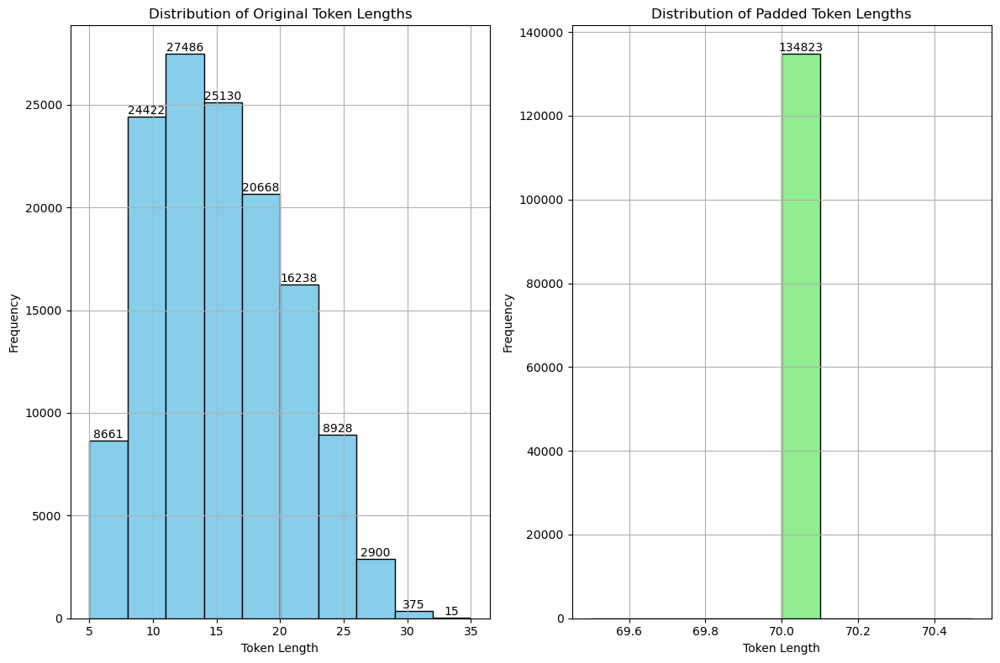

In [20]:
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.sequence import pad_sequences

# Assuming text_encoded_train is already defined
max_length_tokens = 70  # As previously mentioned

# Apply padding
text_padded_train = pad_sequences(text_encoded_train, maxlen=max_length_tokens, padding='post')

# Calculate the lengths of original and padded sequences
original_lengths = [len(seq) for seq in text_encoded_train]
padded_lengths = [len(seq) for seq in text_padded_train]

# Visualize the distribution of original sequence lengths
plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)  # 1 row, 2 columns, 1st subplot
counts_orig, bins_orig, _ = plt.hist(original_lengths, color='skyblue', edgecolor='black')
plt.title('Distribution of Original Token Lengths')
plt.xlabel('Token Length')
plt.ylabel('Frequency')
plt.grid(True)

# Annotations for the original lengths histogram
for i, count in enumerate(counts_orig):
    if count > 0:
        plt.text(bins_orig[i] + (bins_orig[i+1] - bins_orig[i]) / 2, count, str(int(count)),
                 ha='center', va='bottom', fontsize=10, color='black')

# Visualize the distribution of padded sequence lengths
plt.subplot(1, 2, 2)  # 1 row, 2 columns, 2nd subplot
counts_padded, bins_padded, _ = plt.hist(padded_lengths, color='lightgreen', edgecolor='black')
plt.title('Distribution of Padded Token Lengths')
plt.xlabel('Token Length')
plt.ylabel('Frequency')
plt.grid(True)

# Annotations for the padded lengths histogram
for i, count in enumerate(counts_padded):
    if count > 0:
        plt.text(bins_padded[i] + (bins_padded[i+1] - bins_padded[i]) / 2, count, str(int(count)),
                 ha='center', va='bottom', fontsize=10, color='black')

plt.tight_layout()
plt.show()


In [21]:
# Validation set
# Tokens to number sequences
text_encoded_val = tokens.texts_to_sequences(text_val)

# Padding to a determined length
text_padded_val = pad_sequences(text_encoded_val,
                            maxlen = max_length_tokens, 
                            padding = 'post') # Padding after sequence

# Test set
# Tokens to number sequences
text_encoded_test = tokens.texts_to_sequences(text_test)

# Padding to a determined length
text_padded_test = pad_sequences(text_encoded_test,
                            maxlen = max_length_tokens, 
                            padding = 'post') # Padding after sequence

In [24]:
#glove embeddings

In [22]:
# Dictionary for embeddings
glove_file_path = "C:/Users/ASUS/Desktop/Project/MS_Project/glove.twitter.27B/glove.twitter.27B.200d.txt"
embed_length = 200 # From glove.twitter.27B.200d.txt (dimensions)

embedding_index = {} # Embedding dictionary
with open(glove_file_path, 'r', encoding='utf-8') as file:
    for line in file:
        temp = line.split()
        word = temp[0]
        coefs = np.asarray(temp[1:], dtype = np.float32)
        embedding_index[word] = coefs # Add word to dictionary with the embedding values

print('Length of word vectors:', len(embedding_index))

Length of word vectors: 1193514


In [23]:
# Weight matrix for training set tokens 
vocab_length = len(tokens.word_index) + 1  
embedding_matrix = np.zeros((vocab_length, embed_length))
 
for word, index in tokens.word_index.items():
    embedding_vector = embedding_index.get(word)
 
    if embedding_vector is not None:
        embedding_matrix[index] = embedding_vector

print('Dimensions of matrix: %d rows x %d columns' %
      (len(embedding_matrix), len(embedding_matrix[0])))

Dimensions of matrix: 259979 rows x 200 columns


In [24]:
text_padded_train = np.array(text_padded_train, dtype = 'float32')
labels_train = np.array(labels_train, dtype = 'float32')

text_padded_val = np.array(text_padded_val, dtype = 'float32')
labels_val = np.array(labels_val, dtype = 'float32')

text_padded_test = np.array(text_padded_test, dtype = 'float32')
labels_test = np.array(labels_test, dtype = 'float32')

In [25]:
#Model-implemmentation

In [26]:
import models as mod
from tensorflow.keras.utils import plot_model
from sklearn.utils import class_weight

In [31]:
#LSTM

In [27]:
from keras.models import Sequential
from keras.layers import Embedding, LSTM, Dense, Dropout, Bidirectional, BatchNormalization
from keras.initializers import Constant
from keras.optimizers import Adam
from keras.callbacks import EarlyStopping, ModelCheckpoint
import numpy as np
from sklearn.utils import class_weight

def model_LSTM(units_layer1, units_layer2, vocab_len, embed_len, max_len_tok, embed_mat, n_dropout, bi, num_classes):
    model = Sequential()
    model.add(Embedding(input_dim=vocab_len, output_dim=embed_len, input_length=max_len_tok,
                        embeddings_initializer=Constant(embed_mat), trainable=False))
    if bi:
        model.add(Bidirectional(LSTM(units_layer1, dropout=0.2, recurrent_dropout=0.2)))
    else:
        model.add(LSTM(units_layer1, dropout=0.2, recurrent_dropout=0.2))
    model.add(BatchNormalization())
    model.add(Dense(units_layer2, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(num_classes, activation='softmax'))
    model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])
    return model



In [32]:
# Assuming you've already defined vocab_length, embed_length, max_length_tokens, embedding_matrix, and labels_train
num_classes = len(np.unique(labels_train)) 
model_lstm_multiclass = model_LSTM(units_layer1=128, units_layer2=64, vocab_len=vocab_length, embed_len=embed_length,
                                   max_len_tok=max_length_tokens, embed_mat=embedding_matrix, n_dropout=0.3, bi=True, num_classes=num_classes)

In [33]:
#for 0,1,2,5 classes

from sklearn.utils import class_weight
import numpy as np

# Your unique classes are already identified
unique_classes = np.array([0, 1, 2, 5])

# Compute class weights for these classes
class_weights_arr = class_weight.compute_class_weight('balanced',
                                                      classes=unique_classes,
                                                      y=labels_train)  # Ensure labels_train is a flat array of your labels

# Create a dictionary mapping class labels to their computed weights
class_weight_dict = dict(zip(unique_classes, class_weights_arr))

print("Class weights dictionary:", class_weight_dict)


Class weights dictionary: {0: 0.3199528221289845, 1: 2.6619609856262834, 2: 3.540891900409707, 5: 4.619757401315789}


In [34]:
# Original class weights for non-consecutive labels
original_class_weight_dict = {0: 0.3199528221289845, 1: 2.642759134389211, 2: 3.543125197098707, 5: 4.674861303744799}

# Map the original class labels to consecutive labels {0, 1, 2, 5} -> {0, 1, 2, 3}
class_label_mapping = {0: 0, 1: 1, 2: 2, 5: 3}
mapped_class_weight_dict = {class_label_mapping[key]: value for key, value in original_class_weight_dict.items()}

print("Mapped Class Weights:", mapped_class_weight_dict)


Mapped Class Weights: {0: 0.3199528221289845, 1: 2.642759134389211, 2: 3.543125197098707, 3: 4.674861303744799}


In [39]:
from tensorflow.keras.utils import to_categorical

# Example mapping function
def remap_labels(labels):
    mapping = {0: 0, 1: 1, 2: 2, 5: 3}
    return np.array([mapping[label] for label in labels])

# Apply mapping to your labels
labels_train_mapped = remap_labels(labels_train)  # Assuming labels_train_original is your original labels
labels_val_mapped = remap_labels(labels_val)
labels_test_mapped = remap_labels(labels_test)

# Now, you can safely apply to_categorical
labels_train = to_categorical(labels_train_mapped, num_classes=4)
labels_val = to_categorical(labels_val_mapped, num_classes=4)
labels_test = to_categorical(labels_test_mapped, num_classes=4)


In [40]:
# Add callbacks for Early Stopping and Model Checkpointing
callbacks = [EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True),
             ModelCheckpoint(filepath='best_model.h5', monitor='val_loss', save_best_only=True)]

history_lstm_multiclass = model_lstm_multiclass.fit(text_padded_train, labels_train, batch_size=64, epochs=30,
                                                    validation_data=(text_padded_val, labels_val), shuffle=True,
                                                    class_weight=mapped_class_weight_dict, verbose=1, callbacks=callbacks)

Epoch 1/30


2107/2107 [==============================] - ETA: 0s - loss: 1.1150 - accuracy: 0.4450

C:\Users\ASUS\anaconda3\Lib\site-packages\keras\src\engine\training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


2107/2107 [==============================] - 738s 347ms/step - loss: 1.1150 - accuracy: 0.4450 - val_loss: 1.0586 - val_accuracy: 0.5640
Epoch 2/30
2107/2107 [==============================] - 686s 325ms/step - loss: 1.0332 - accuracy: 0.5088 - val_loss: 1.0243 - val_accuracy: 0.5910
Epoch 3/30
2107/2107 [==============================] - 529s 251ms/step - loss: 1.0182 - accuracy: 0.5133 - val_loss: 1.0839 - val_accuracy: 0.5630
Epoch 4/30
2107/2107 [==============================] - 545s 259ms/step - loss: 1.0056 - accuracy: 0.5208 - val_loss: 1.0308 - val_accuracy: 0.5848
Epoch 5/30
2107/2107 [==============================] - 539s 256ms/step - loss: 0.9928 - accuracy: 0.5230 - val_loss: 1.0339 - val_accuracy: 0.5586
Epoch 6/30
2107/2107 [==============================] - 549s 261ms/step - loss: 0.9812 - accuracy: 0.5164 - val_loss: 1.0302 - val_accuracy: 0.5796
Epoch 7/30
2107/2107 [==============================] - 545s 259ms/step - loss: 0.9639 - accuracy: 0.5107 - val_loss: 1.034

In [41]:
# Evaluate the multiclass LSTM model on the test data
model_lstm_multiclass_results = model_lstm_multiclass.evaluate(text_padded_test, labels_test, verbose=1)


313/313 [==============================] - 4s 12ms/step - loss: 1.0418 - accuracy: 0.5840


In [ ]:
from sklearn.metrics import classification_report
import numpy as np

# Predict the probabilities for the test set
y_pred_probs = model_lstm_multiclass.predict(text_padded_test)
y_pred = np.argmax(y_pred_probs, axis=1)
y_true = np.argmax(labels_test, axis=1)
print(classification_report(y_true, y_pred))


pip install matplotlib scikit-learn


In [ ]:
import numpy as np
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
from itertools import cycle

# Predict probabilities
y_pred_probs = model_lstm_multiclass.predict(text_padded_test)

# Number of classes
n_classes = labels_test.shape[1]

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(labels_test[:, i], y_pred_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(labels_test.ravel(), y_pred_probs.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# Plot ROC curve for each class and the micro-average
plt.figure(figsize=(10, 8))
lw = 2
colors = cycle(['aqua', 'darkorange', 'cornflowerblue', 'green', 'red', 'purple', 'brown', 'pink', 'gray', 'olive'])

for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=lw,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(i, roc_auc[i]))

plt.plot(fpr["micro"], tpr["micro"],
         label='micro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["micro"]),
         color='deeppink', linestyle=':', linewidth=4)

plt.plot([0, 1], [0, 1], 'k--', lw=lw)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic to Multi-Class')
plt.legend(loc="lower right")
plt.show()


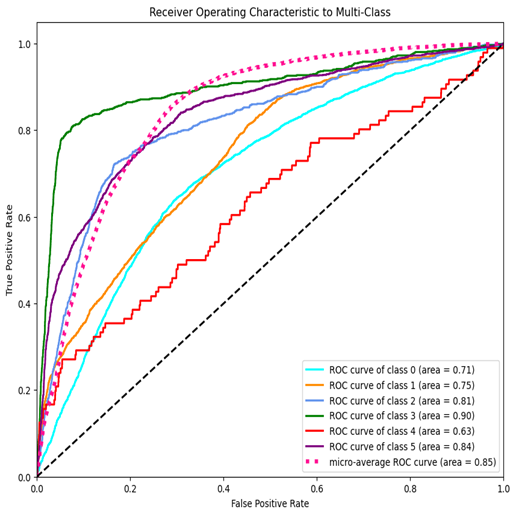

313/313 [==============================] - 4s 12ms/step


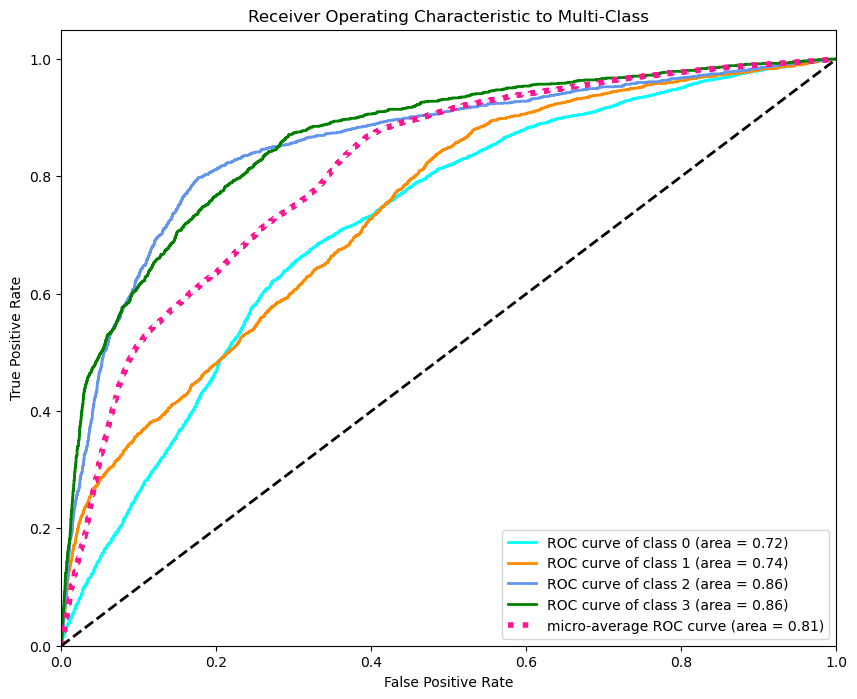

In [43]:
import numpy as np
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
from itertools import cycle

# Predict probabilities
y_pred_probs = model_lstm_multiclass.predict(text_padded_test)

# Number of classes
n_classes = labels_test.shape[1]

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(labels_test[:, i], y_pred_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(labels_test.ravel(), y_pred_probs.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# Plot ROC curve for each class and the micro-average
plt.figure(figsize=(10, 8))
lw = 2
colors = cycle(['aqua', 'darkorange', 'cornflowerblue', 'green', 'red', 'purple', 'brown', 'pink', 'gray', 'olive'])

for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=lw,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(i, roc_auc[i]))

plt.plot(fpr["micro"], tpr["micro"],
         label='micro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["micro"]),
         color='deeppink', linestyle=':', linewidth=4)

plt.plot([0, 1], [0, 1], 'k--', lw=lw)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic to Multi-Class')
plt.legend(loc="lower right")
plt.show()


pip install lime


In [ ]:
from lime.lime_text import LimeTextExplainer
from keras.preprocessing.sequence import pad_sequences
import numpy as np
from keras.preprocessing.text import Tokenizer
tokens = Tokenizer()
# Initialize the tokenizer
  # This sets a maximum number of words to keep, based on word frequency.
max_length_tokens = 70

# Assuming `model_lstm_multiclass` is your trained model
# and you have a `Tokenizer` instance named `tokens` prepared as shown

# Convert the tokenizer (tokens) word_index to a dictionary mapping integers to words
index_to_word = {value: key for key, value in tokens.word_index.items()}

def tokens_to_text(tokens):
    return ' '.join(index_to_word.get(token, '?') for token in tokens if token > 0)

def predict_texts(texts):
    # Convert texts to sequence of indices using the corrected tokenizer name `tokens`
    sequences = tokens.texts_to_sequences(texts)
    padded_sequences = pad_sequences(sequences,
                            maxlen = max_length_tokens, 
                            padding = 'post')# Use your max_length_tokens variable
    # Predict
    print(model_lstm_multiclass.predict(padded_sequences))
    return model_lstm_multiclass.predict(padded_sequences)

# Adjust class names according to your combined_names_mapping
class_names = ['Not Hate Speech', 'Identity-Based', 'Gender and Sexual Orientation-Based', 'Other forms of Hate Speech']

# Create a LimeTextExplainer with the updated class names
explainer = LimeTextExplainer(class_names=class_names)

# Example text to explain
text_instance = "africans should leave usa"
exp = explainer.explain_instance(text_instance, predict_texts, num_features=10)

# For Jupyter Notebook use:
# exp.show_in_notebook(text=True)
# For other environments, you might want to save the explanation to an HTML file or adjust accordingly:
exp.save_to_file('lime_explanation_1.html')


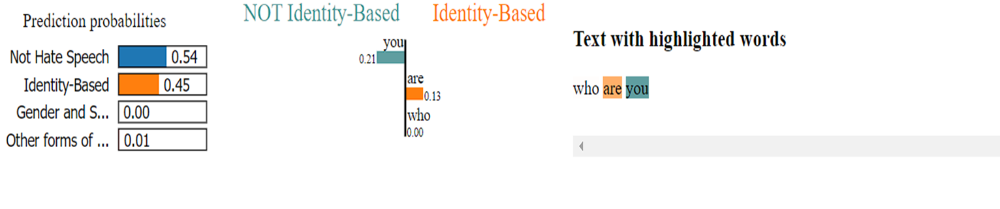

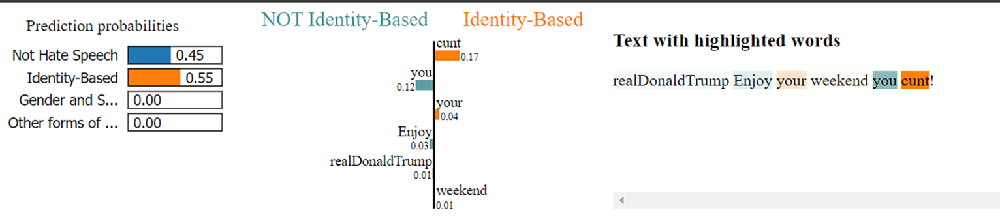

In [49]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import seaborn as sns


In [50]:
# Predict the probabilities for each class
predictions_prob = model_lstm_multiclass.predict(text_padded_val)
# Convert probabilities to class labels
predictions = np.argmax(predictions_prob, axis=1)
# Assuming labels_val are one-hot encoded, get the true labels
true_labels = np.argmax(labels_val, axis=1)


157/157 [==============================] - 2s 13ms/step


In [51]:
# Compute the confusion matrix
cm = confusion_matrix(true_labels, predictions)

# Optionally, normalize the confusion matrix
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]


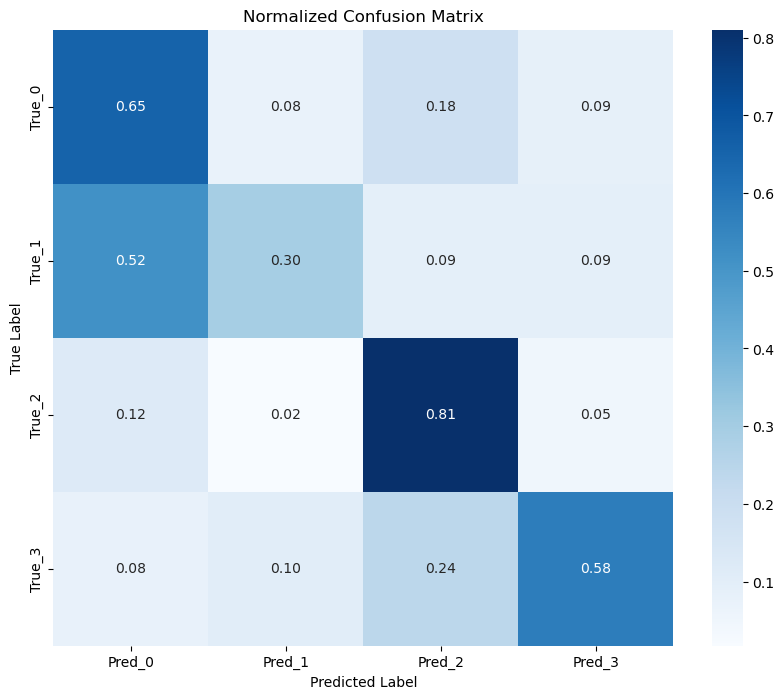

In [52]:
plt.figure(figsize=(10, 8))
sns.heatmap(cm_normalized, annot=True, fmt=".2f", cmap="Blues", 
            xticklabels=[f"Pred_{i}" for i in range(cm.shape[1])], 
            yticklabels=[f"True_{i}" for i in range(cm.shape[0])])
plt.title("Normalized Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()


In [54]:
#Model saved

model_lstm_multiclass.save('C:/Users/ASUS/Desktop/Project/MS_Project/images/LSTM.h5')


C:\Users\ASUS\anaconda3\Lib\site-packages\keras\src\engine\training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
